In [19]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
#plt.style.use('default')
from os import listdir

scene_folder = './images/scenes/'
model_folder = './images/models/'

RED = (255, 40, 30)
GREEN = (50, 255, 30)
BLUE = (10, 127, 255)

ORANGE = (255, 127, 20)
YELLOW = (255, 255, 0)

BLACK = (1, 1, 1)
WHITE = (255, 255, 255)
GRAY = (127, 127, 127)

# Overview

## Create list of model images

## Model images

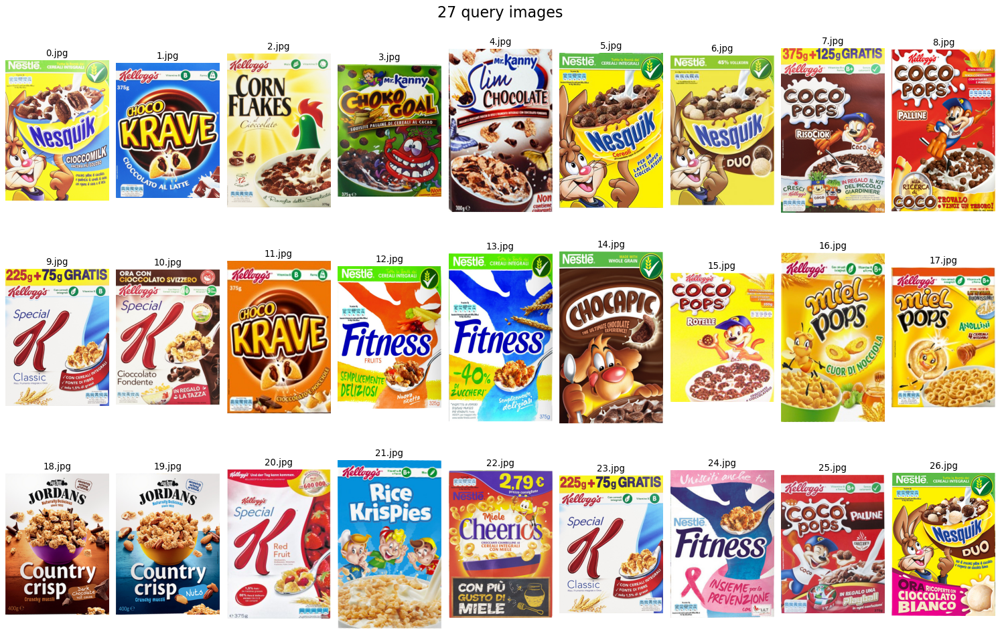

In [20]:
models_props = [{'name': name, 'im': cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB)} for name in listdir(model_folder)]
models_props.sort(key = lambda x: int(x['name'].split('.')[0]))

model_images = [x['im'] for x in models_props]

w, h, dpi = 1500, 1000, 80
fig, axs = plt.subplots(nrows = 3, ncols = 9, dpi = dpi, figsize = (w/dpi, h/dpi))

for image_data, ax in zip(models_props, axs.ravel()):
    ax.imshow(image_data['im'])
    ax.set_title(image_data['name'])
    ax.set_axis_off()
fig.suptitle(f'{len(models_props)} query images', fontsize = 20)
fig.tight_layout(pad = 1)
fig.savefig('./images/results/model_summary.png')
plt.show()

## Scene images

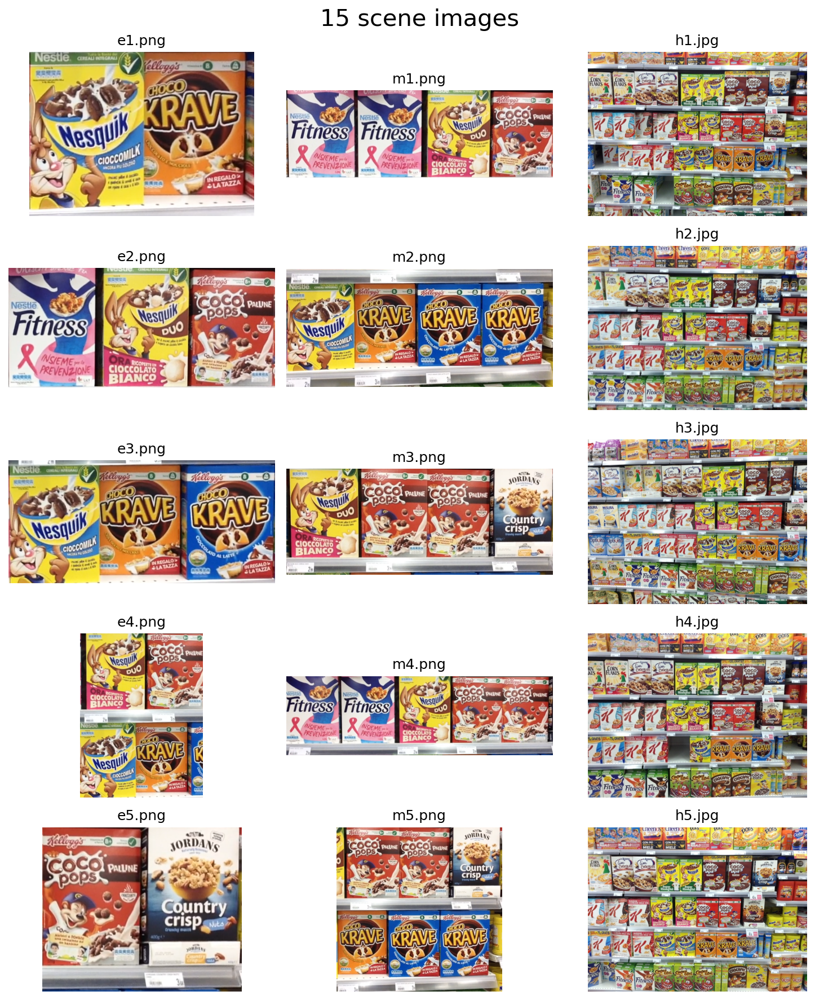

In [21]:
scene_props = [{'name': name, 'im': cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB)} for name in listdir(scene_folder) if not 'h' in name]
scene_props += [{'name': name, 'im': cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB)} for name in listdir(scene_folder) if 'h' in name]

scene_images = [x['im'] for x in scene_props]

w, h, dpi = 1500, 1800, 150
fig, axs = plt.subplots(ncols = 3, nrows = 5, dpi = dpi, figsize = (w/dpi, h/dpi))

for image_data, ax in zip(scene_props, axs.T.ravel()):
    ax.imshow(image_data['im'])
    ax.set_title(image_data['name'])
    ax.set_axis_off()
fig.suptitle(f'{len(scene_props)} scene images', fontsize = 20)
fig.tight_layout(pad = 1)
fig.savefig('./images/results/scene_summary.png')
plt.show()

# Step A: Local invariant features of single query image

## Read images

In [22]:
scene_filenames = [f'e{i+1}.png' for i in range(5)]
model_filenames = [f'{i}.jpg' for i in (0, 1, 11, 19, 24, 25, 26)]

#read images
im_scene_list = [cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB) for name in scene_filenames]
im_model_list = [cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB) for name in model_filenames]

# im_scene_list = [cv2.imread(scene_folder + name, 0) for name in scene_filenames]
# im_model_list = [cv2.imread(model_folder + name, 0) for name in model_filenames]

#resize model images
im_model_list = [cv2.resize(im, (480, 720)) for im in im_model_list]

## Define class for matching features

In [23]:
class FeatureMatcher():
    '''
    Used to compute the matches between two images using local invariant features
    '''
    _computed = False
    _kp1, _des1 = [], []
    _kp2, _des2 = [], []
    _matches = []
    _match_distance_threshold = 0.7
    _homography = np.zeros((3,3))
    _homography_mask = []
    
    def __init__(self, im1, im2):
        self._sift = cv2.xfeatures2d.SIFT_create()
        self.im1 = im1
        self.im2 = im2

    def _find_descriptors_1(self):
        self._kp1, self._des1 = self._sift.compute(self.im1, self._sift.detect(self.im1))

    def _find_descriptors_2(self):
        self._kp2, self._des2 = self._sift.compute(self.im2, self._sift.detect(self.im2))
    
    def set_match_distance_threshold(self, threshold):
        self._match_distance_threshold = threshold
    
    def set_descriptors_1(self, kp, des):
        '''
        Sets keypoints and descriptors for image 1
        '''
        self._kp1 = kp
        self._des1 = des

    def set_descriptors_2(self, kp, des):
        '''
        Sets keypoints and descriptors for image 2
        '''
        self._kp2 = kp
        self._des2 = des
    
    def _reset_matches(self):
        '''
        Resets the internally stored data.
        '''
        self._matches = []
        self._computed = False

    def find_matches(self, force = False):
        '''
        Computes matches between image 1 and 2
        The salient points for the two images and the scene images are stored internally.
        If the salient points and their descriptors are not passed using ``set_descriptors_1`` and ``set_descriptors_2``, they are computed.
        
        Parameters:
        ============
        force: bool, optional
            recomputes the matches if ``find_matches`` has already been called. Default is False.
        '''
        
        if self._computed and not force:
            print('Matches already computed. To compute them again set force=True')
            return
        
        self._reset_matches()
        
        if len(self._kp1) == 0:
            self._find_descriptors_1()

        if len(self._kp2) == 0:
            self._find_descriptors_2()
        
        FLANN_INDEX_KDTREE = 1
        flann = cv2.FlannBasedMatcher(
            {'algorithm': FLANN_INDEX_KDTREE,
             'trees': 5},
            {'checks': 50})
        
        #compute the best 2 matches for each salient point in the query image
        matches = flann.knnMatch(self._des1, self._des2, k=2)
        d = self._match_distance_threshold
        #if the distance between the best matches is less than d times the distance from the second best matches, keep the match
        #otherwise it is probably a false match that needs to be discarded
        self._matches = [m for m,n in matches if m.distance < d*n.distance]
        
        self._find_homography()
        self._computed = True
    
    def _find_homography(self):
        src_pts = np.float32([self._kp1[m.queryIdx].pt for m in self._matches])
        dst_pts = np.float32([self._kp2[m.trainIdx].pt for m in self._matches])
        
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        
        self._homography = M
        self._homography_mask = mask.ravel().tolist()
    
    def get_homography(self):
        '''
        Return:
            homography: ndarray, 3x3 homography matrix between image 1 and image 2

        The homography is computed from the matches using the RANSAC method.
        Note: to get the homography from image 2 and image 1, invert the transformation matrix.
        '''
        return self._homography, self._homography_mask
    
    def get_matches(self):
        '''
        Return:
            matches: list of cv2.DMatch, the matches between image 1 and image 2
        '''
        return self._matches
    
    def get_keypoints(self):
        '''
        Return:
            kp1: list of cv2.KeyPoint, keypoints of image 1
            kp2: list of cv2.KeyPoint, keypoints of image 2
        '''
        return self._kp1, self._kp2

    def get_descriptors(self):
        '''
        Return:
            des1: descriptors of image 1
            des2: descriptors of image 2
        '''
        return self._des1, self._des2

### Test on a pair of images

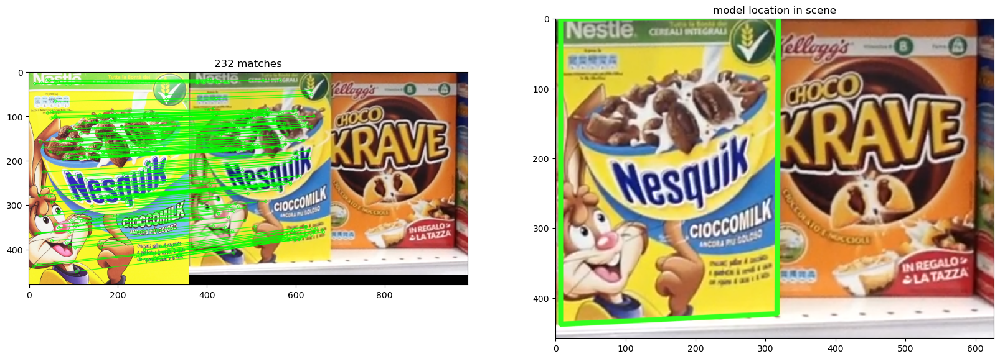

In [24]:
#im_scene = cv2.imread(scene_folder + 'e1.png', cv2.IMREAD_GRAYSCALE)
#im_model = cv2.imread(model_folder + '0.jpg', cv2.IMREAD_GRAYSCALE)
im_scene = cv2.cvtColor(cv2.imread(scene_folder + 'e1.png'), cv2.COLOR_BGR2RGB)
im_model = cv2.cvtColor(cv2.imread(model_folder + '0.jpg'), cv2.COLOR_BGR2RGB)

im_model = cv2.resize(im_model, (360, 480))

matcher = FeatureMatcher(im_model, im_scene)
matcher.find_matches()

matches = matcher.get_matches()
M, mask = matcher.get_homography()
kp_model, kp_scene = matcher.get_keypoints()

# im1 = cv2.drawMatches(im_scene, kp_scene, im_model, kp_model, matches, None,
#                       matchColor = ORANGE,
#                       singlePointColor = None,
#                       matchesMask = mask,
#                       flags = 2)
draw_params = dict(matchColor=(0, 255, 0),  # draw matches in green color
                   singlePointColor=None,  # not draw keypoints only matching lines
                   matchesMask=mask,  # draw only inliers
                   flags=2)  # not draw keypoints only lines
im1 = cv2.drawMatches(im_model, kp_model, im_scene,
                       kp_scene, matches, None, **draw_params)

# im2 = np.zeros(im_model.shape, dtype = np.uint8)
# im2 = cv2.rectangle(im2, (0,0), (im2.shape[1], im2.shape[0]), GREEN, int(im_model.shape[0]*0.05))

# w, h = im_scene.shape[0], im_scene.shape[1]
# im2 = cv2.warpPerspective(im2, np.linalg.inv(M), (h,w))
# im2[im2==0] = im_scene[im2==0]

h, w = im_model.shape[0], im_model.shape[1]
pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)

# Projecting the corners into the train image
dst = cv2.perspectiveTransform(pts, M)

# Drawing the bounding box
im2 = cv2.polylines(im_scene, [np.int32(dst)], True, GREEN, 5, cv2.LINE_AA)

w, h, dpi = 2000, 1500, 100
fig, axs = plt.subplots(ncols = 2, figsize = (w/dpi, h/dpi), dpi = dpi)

axs[0].imshow(im1)
axs[0].set_title(f"{len(matches)} matches")

axs[1].imshow(im2)
axs[1].set_title('model location in scene')

plt.show()


## Compute matches between each pair of scene and model image
This is done to find out what the optimal threshold for the number of matching points

### Find salient points of the images and corresponding descriptors

In [25]:
sift = cv2.xfeatures2d.SIFT_create()
kp_scene_list, des_scene_list = sift.compute(im_scene_list, sift.detect(im_scene_list))
kp_model_list, des_model_list = sift.compute(im_model_list, sift.detect(im_model_list))

### Create matrix with number of matches

In [26]:
matcher_matrix = np.zeros((len(im_scene_list), len(im_model_list)), dtype = object)
matches_matrix = np.zeros(matcher_matrix.shape, dtype = int)

for i, (im_scene, kp_scene, des_scene) in enumerate(zip(im_scene_list, kp_scene_list, des_scene_list)):
    for j, (im_model, kp_model, des_model) in enumerate(zip(im_model_list, kp_model_list, des_model_list)):
        matcher = FeatureMatcher(im_model, im_scene)
        #set the previously computed descriptors and keypoints for performance reasons
        matcher.set_descriptors_1(kp_scene, des_scene)
        matcher.set_descriptors_2(kp_model, des_model)
        matcher.find_matches()
        matcher_matrix[i][j] = matcher
        matches_matrix[i][j] = len(matcher.get_matches())

### Display matches matrix

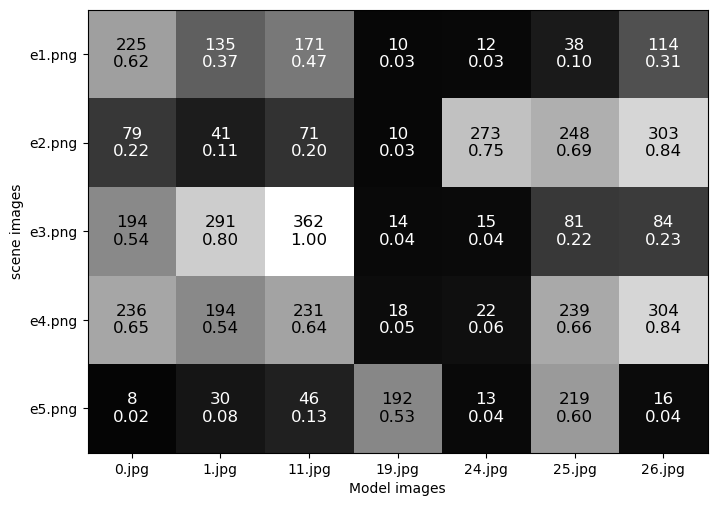

In [27]:
w, h, dpi = 800, 600, 100

fig, ax = plt.subplots(figsize = (w/dpi, h/dpi), dpi = dpi)
ax.imshow(matches_matrix, cmap = 'gray', vmin = 0)
ax.set_aspect('equal')

ax.set_xticks(range(len(model_filenames)), model_filenames)
ax.set_yticks(range(len(scene_filenames)), scene_filenames)

ax.set_xlabel('Model images')
ax.set_ylabel('scene images')

#annotate value
for i, line in enumerate(matches_matrix):
    for j, n in enumerate(line):
        if n < 0.5*np.max(matches_matrix):
            col = 'w'
        else:
            col = 'k'
        ax.text(j, i, f'{n}\n{n/np.max(matches_matrix):.2f}', ha="center", va="center", color=col, size = 12)

plt.show()

## Display image pairs with the most number of matches and boundig boxes

In [28]:
MIN_MATCH_NUMBER = 180

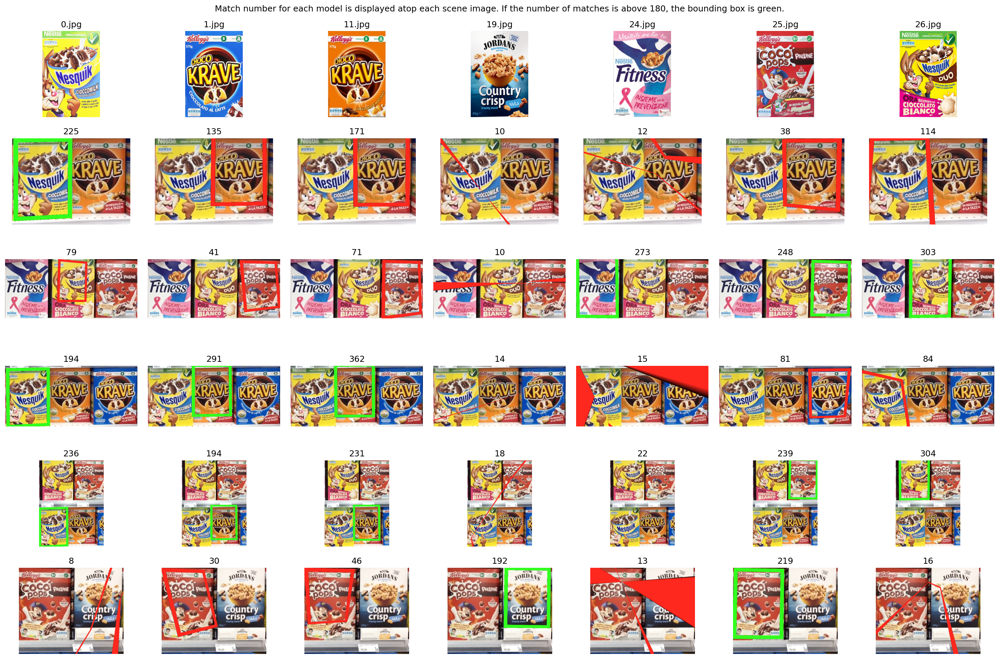

In [29]:
w, h, dpi = 3000, 2000, 150
fig, axs = plt.subplots(nrows = matcher_matrix.shape[0]+1, ncols = matcher_matrix.shape[1], figsize = (w/dpi, h/dpi), dpi = dpi)

for i, line in enumerate(matcher_matrix):
    im_scene = np.copy(im_scene_list[i])
    for j, matcher in enumerate(line):
        matches = matcher.get_matches()
        if len(matches) >= MIN_MATCH_NUMBER:
            color = GREEN
        else:
            color = RED
        
        im_model = np.copy(im_model_list[j])
        
        w, h = im_model.shape[0], im_model.shape[1]
        model_aspect = h/w
        imr = np.zeros(im_model.shape, dtype = np.uint8)
        imr = cv2.rectangle(imr, (0,0), (h,w), color, int(imr.shape[0]*0.1))
        
        M, _ = matcher.get_homography()
        
        w, h = im_scene.shape[0], im_scene.shape[1]
        scene_aspect = h/w
        imr = cv2.warpPerspective(imr, np.linalg.inv(M), (h,w))
        
        imr[imr==0] = im_scene[imr==0]
        
        axs[i+1,j].imshow(imr)
        axs[i+1,j].set_title(len(matches))

for i, ax in enumerate(axs[0, :]):
    ax.imshow(im_model_list[i])
    ax.set_title(model_filenames[i])

for ax in axs.ravel():
    ax.set_axis_off()

fig.suptitle(f'Match number for each model is displayed atop each scene image. If the number of matches is above {MIN_MATCH_NUMBER}, the bounding box is green.')
fig.tight_layout(pad = 1.5)
#fig.savefig('images/results/match_number.png')
plt.show()

In [42]:
""" for i, line in enumerate(matcher_matrix):
    for j, matcher in enumerate(line):
        matches = matcher.get_matches()
        if len(matches) >= MIN_MATCH_NUMBER:
            color = GREEN
        else:
            color = RED

        im_scene = np.copy(im_scene_list[i])
        im_model = np.copy(im_model_list[j])

        w, h = im_model.shape[0], im_model.shape[1]
        model_aspect = h/w
        imr = np.zeros(im_model.shape, dtype = np.uint8)
        imr = cv2.rectangle(imr, (0,0), (h,w), color, int(imr.shape[0]*0.1))
        
        M, _ = matcher.get_homography()

        w, h = im_scene.shape[0], im_scene.shape[1]
        scene_aspect = h/w
        imr = cv2.warpPerspective(imr, np.linalg.inv(M), (h,w))
        
        imr[imr==0] = im_scene[imr==0]
        
        w, h, dpi = 1280, 720, 100
        fig, axs = plt.subplots(ncols = 2, figsize = (w/dpi, h/dpi), dpi = dpi, gridspec_kw = {'width_ratios': (model_aspect, scene_aspect)})
        
        axs[0].imshow(im_model)
        axs[0].set_title(model_filenames[j])

        axs[1].imshow(imr)
        axs[1].set_title(scene_filenames[i])
        
        for ax in axs:
            ax.set_axis_off()
        
        fig.suptitle(f'Matches: {len(matches)}')
        
        fig.tight_layout()
        plt.show()
"""

" for i, line in enumerate(matcher_matrix):\n    for j, matcher in enumerate(line):\n        matches = matcher.get_matches()\n        if len(matches) >= MIN_MATCH_NUMBER:\n            color = GREEN\n        else:\n            color = RED\n\n        im_scene = np.copy(im_scene_list[i])\n        im_model = np.copy(im_model_list[j])\n\n        w, h = im_model.shape[0], im_model.shape[1]\n        model_aspect = h/w\n        imr = np.zeros(im_model.shape, dtype = np.uint8)\n        imr = cv2.rectangle(imr, (0,0), (h,w), color, int(imr.shape[0]*0.1))\n        \n        M, _ = matcher.get_homography()\n\n        w, h = im_scene.shape[0], im_scene.shape[1]\n        scene_aspect = h/w\n        imr = cv2.warpPerspective(imr, np.linalg.inv(M), (h,w))\n        \n        imr[imr==0] = im_scene[imr==0]\n        \n        w, h, dpi = 1280, 720, 100\n        fig, axs = plt.subplots(ncols = 2, figsize = (w/dpi, h/dpi), dpi = dpi, gridspec_kw = {'width_ratios': (model_aspect, scene_aspect)})\n        \n

# Step B: Multiple instance detection

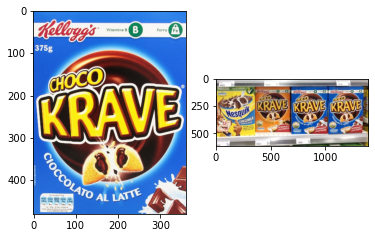

In [31]:
scene_filenames = [f'm{i+1}.png' for i in range(5)]
model_filenames = [f'{i}.jpg' for i in (0, 1, 11, 19, 24, 25, 26)]

im_scene_list = [cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB) for name in scene_filenames]
im_model_list = [cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB) for name in model_filenames]

im_scene = cv2.cvtColor(cv2.imread(scene_folder + 'm2.png'), cv2.COLOR_BGR2RGB)
im_model = cv2.cvtColor(cv2.imread(model_folder + '1.jpg'), cv2.COLOR_BGR2RGB)

im_model = cv2.resize(im_model, (360, 480))

fig, axs = plt.subplots(ncols = 2)

axs[0].imshow(im_model)
axs[1].imshow(im_scene)
plt.show()

## Generalized Hough transform

Matches: 166


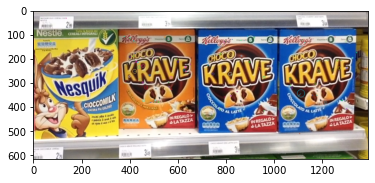

In [32]:
matcher = FeatureMatcher(im_model, im_scene)
matcher.set_match_distance_threshold(0.8)
matcher.find_matches()

kp_model, kp_scene = matcher.get_keypoints()
des_model, des_scene = matcher.get_descriptors()

matches = matcher.get_matches()
print(f'Matches: {len(matches)}')

kp_model = [kp_model[i] for i in [m.queryIdx for m in matches]]
kp_scene = [kp_scene[i] for i in [m.trainIdx for m in matches]]

im2 = cv2.drawKeypoints(im_scene, kp_scene, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(im2)
plt.show()


In [33]:
kp_model_pos = np.asarray([k.pt for k in kp_model])
kp_scene_pos = np.asarray([k.pt for k in kp_scene])

kp_model_angle = np.asarray([k.angle for k in kp_model])
kp_scene_angle = np.asarray([k.angle for k in kp_scene])
#theta = -kp_scene_angle + kp_model_angle
theta = kp_scene_angle - kp_model_angle

kp_model_size = np.asarray([k.size for k in kp_model])
kp_scene_size = np.asarray([k.size for k in kp_scene])
#s = kp_model_size/kp_scene_size
s = kp_scene_size/kp_model_size

barycenter_model = np.mean(kp_model_pos, axis = 0)

r_vectors = barycenter_model - kp_model_pos
r_vectors.shape

(166, 2)

In [34]:
rotmats = np.array([[np.cos(theta), -np.sin(theta)],
                   [np.sin(theta), np.cos(theta)]])
rotmats = np.moveaxis(rotmats, (2,0,1), (0,1,2))

In [35]:
r_vectors_rotated = rotmats@np.expand_dims(r_vectors, axis = -1)
r_vectors_rotated = r_vectors_rotated.squeeze()

r_vectors_scaled = np.multiply(r_vectors_rotated, np.expand_dims(s, axis = -1))
vote_pos = kp_scene_pos + r_vectors_scaled
vote_pos = np.rint(vote_pos).astype(int)

In [36]:
accumulator = np.zeros((im_scene.shape[1], im_scene.shape[0]))

vote_pos = vote_pos[(vote_pos[:,0] < accumulator.shape[0]) & (vote_pos[:,1] < accumulator.shape[1])]
vote_pos = vote_pos[(vote_pos[:,0] >= 0) & (vote_pos[:,1] >= 0)]

for pos in vote_pos:
    i,j = pos
    accumulator[i,j] +=1

In [37]:
import cmasher as cmr
#a,b = 11, 16
a,b = 0,0
m,n = accumulator[a:, b:].shape
print((m,n))
subsampling = 1
m_bins = 10
n_bins = 10
acc_bin = accumulator[a:,b:].reshape(m // subsampling, subsampling, n // subsampling, subsampling).sum(3).sum(1)
#acc_bin = accumulator[a:,b:].reshape(m_bins, m // m_bins, n_bins, n // n_bins).sum(3).sum(1)

#acc_bin = cv2.GaussianBlur(acc_bin, (31,31), 3)
print(np.max(acc_bin))

(1391, 616)
1.0


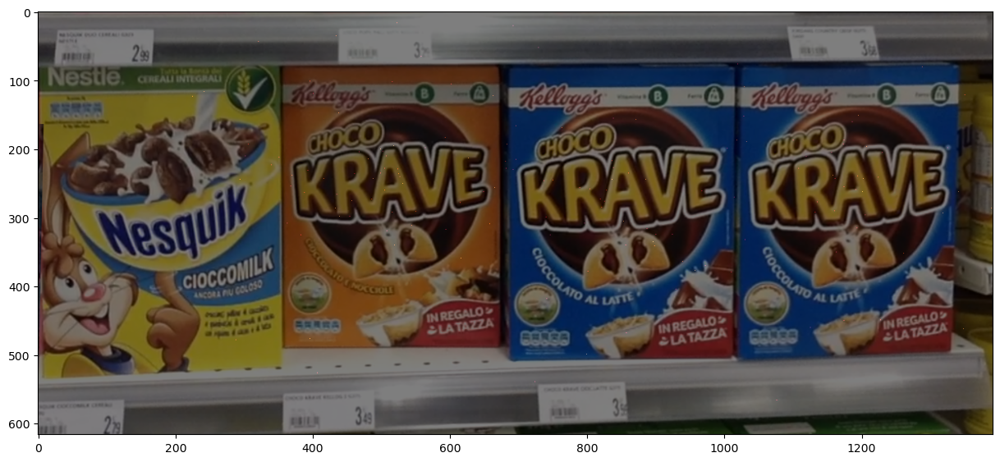

In [38]:
w, h, dpi = 1500, 1000, 100
fig, ax = plt.subplots(figsize = (w/dpi,h/dpi), dpi = dpi)

w, h = im_scene.shape[0], im_scene.shape[1]
acc_bin = cv2.resize(acc_bin.astype(np.float32), (w, h), interpolation = cv2.INTER_NEAREST)
plt.imshow(acc_bin.T, cmap = cmr.sunburst)#, alpha = 0.9)
plt.imshow(im_scene, alpha = 0.5)
plt.show()

In [39]:
alg = cv2.createGeneralizedHoughBallard()
alg.setTemplate(kp_model_array)
alg.setDp(2)
positions, votes = alg.detect(kp_scene_array)
#positions, votes = positions[0], votes[0]
positions.shape

NameError: name 'kp_model_array' is not defined

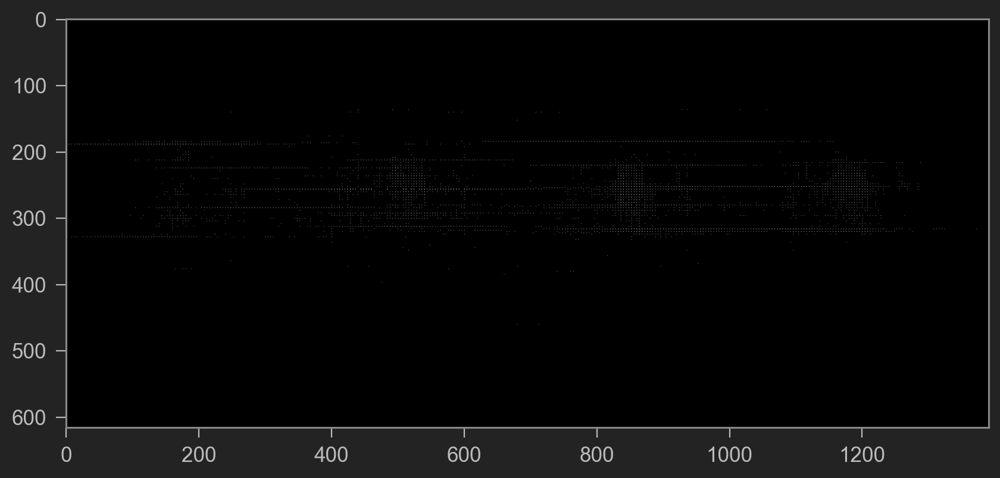

In [ ]:
w, h = im_scene.shape[0], im_scene.shape[1]
im = np.zeros((w,h), dtype = np.uint8)

for i, v in enumerate(votes):
    x = int(positions[i,1])
    y = int(positions[i,0])
    im[x,y] = votes[i,0]

w, h, dpi = 2000, 1000, 200
fig, ax = plt.subplots(figsize = (w/dpi,h/dpi), dpi = dpi)
ax.imshow(im, cmap = 'gray')
plt.show()

In [ ]:
np.max(votes)

278

## Modify the ImageMatcher class 

In [ ]:
class MultipleInstanceMatcher(FeatureMatcher):
    def __init__(self, im1, im2):
        super().__init__(im1, im2)
    
    

In [ ]:
matcher = MultipleInstanceMatcher(im_scene, im_model)
matcher.find_matches()
M, mask = matcher.get_homography()
kp1, kp2 = matcher.get_keypoints()
matches = matcher.get_matches()

Joined lines 22 and 20
Joined lines 28 and 26
Joined lines 29 and 25
Joined lines 30 and 14
Joined lines 31 and 20
Joined lines 31 and 22
Joined lines 32 and 20
Joined lines 36 and 21
Joined lines 37 and 12
Joined lines 40 and 21
Joined lines 41 and 8
Joined lines 43 and 26
Joined lines 46 and 8
Joined lines 47 and 30
Joined lines 48 and 27
Joined lines 50 and 14
Joined lines 52 and 14
Joined lines 53 and 19
Joined lines 54 and 33
Joined lines 58 and 33
Joined lines 61 and 26
Joined lines 62 and 27
Joined lines 66 and 56


/tmp/ipykernel_178865/659967087.py:10: RuntimeWarning: divide by zero encountered in int_scalars
  return np.abs(np.arctan((ya2-ya1)/(xa2-xa1)) - np.arctan((yb2-yb1)/(xb2-xb1))) <= deviation_threshold


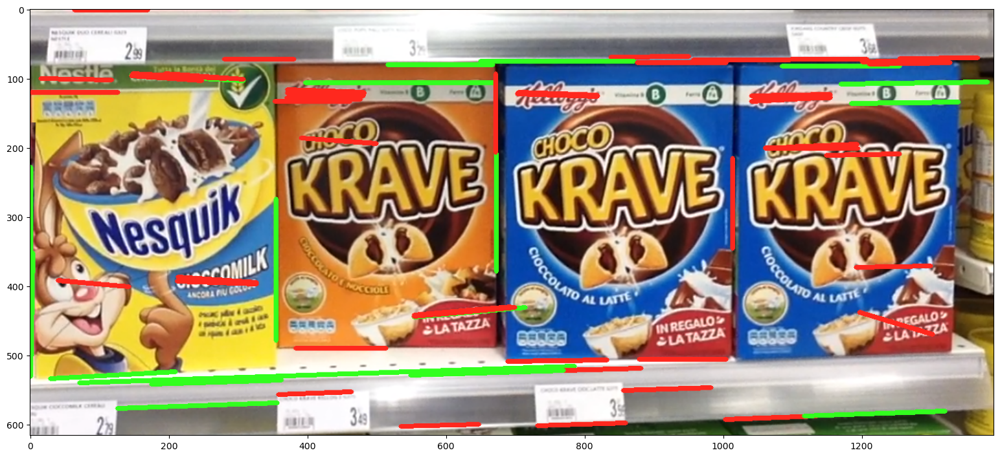

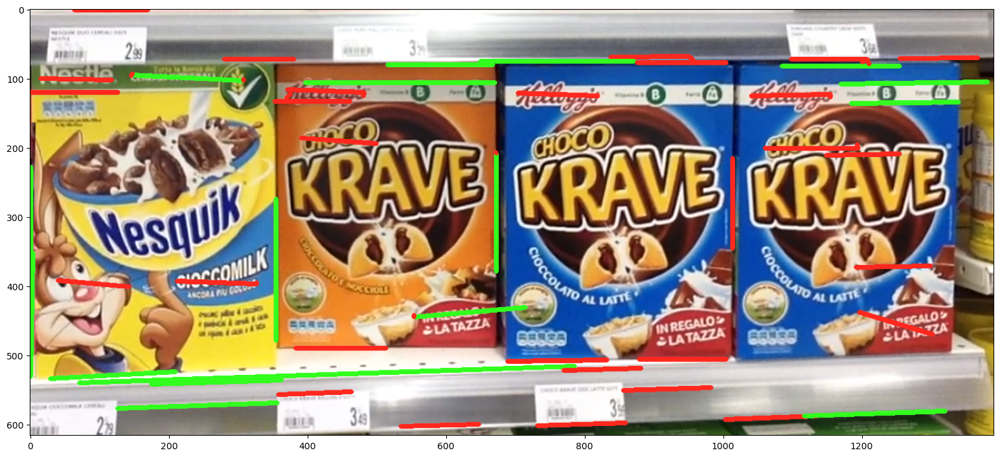

In [ ]:
im2 = np.copy(im_scene)
edges = cv2.Canny(im2, 50, 200, apertureSize = 3)

lines = cv2.HoughLinesP(edges,1,np.pi/180,100,minLineLength=100,maxLineGap=10)
joined_lines = []

def lines_parallel(line_a, line_b, deviation_threshold = np.pi/180):
    xa1, ya1, xa2, ya2 = line_a
    xb1, yb1, xb2, yb2 = line_b
    return np.abs(np.arctan((ya2-ya1)/(xa2-xa1)) - np.arctan((yb2-yb1)/(xb2-xb1))) <= deviation_threshold

def get_extremes_distance(line_a, line_b):
    d11 = np.sqrt((xa1-xb1)**2 + (ya1-yb1)**2)
    d21 = np.sqrt((xa1-xb2)**2 + (ya1-yb2)**2)
    d12 = np.sqrt((xa2-xb1)**2 + (ya2-yb1)**2)
    d22 = np.sqrt((xa2-xb2)**2 + (ya2-yb2)**2)
    return [d11, d12, d21, d22]

def extremes_coincide(line_a, line_b, distance_threshold = 1):
    coincidence = False
    for d in get_extremes_distance(line_a, line_b):
        if d <= distance_threshold:
            coincidence = True
    return coincidence

def join_lines(line_a, line_b):
    xa1, ya1, xa2, ya2 = line_a
    xb1, yb1, xb2, yb2 = line_b

    distances = get_extremes_distance(line_a, line_b)
    if np.argmin(distances) == 3:
        return [xa2, ya2, xb2, yb2]
    if np.argmin(distances) == 2:
        return [xa1, ya1, xb2, yb2]
    if np.argmin(distances) == 1:
        return [xa2, ya2, xb1, yb1]
    
    return [xa1, ya1, xb1, yb1]

for i in range(len(lines)):
    line_a = lines[i][0]
    xa1, ya1, xa2, ya2 = line_a
    for j in range(i-1):
        #if i == j: continue
        line_b = lines[j][0]
        
        xb1, yb1, xb2, yb2 = line_b
        if lines_parallel(line_a, line_b, 3*np.pi/180) and extremes_coincide(line_a, line_b, 10):
            line_a = join_lines(line_a, line_b)
            print(f'Joined lines {i} and {j}')
    joined_lines.append([line_a])

im3 = np.copy(im2)

for i, line in enumerate(lines):
    x1,y1,x2,y2 = line[0]
    if np.sqrt((x2-x1)**2 + (y2-y1)**2) >= 150:
        cv2.line(im2,(x1,y1),(x2,y2), GREEN, 5)
    else:
        cv2.line(im2,(x1,y1),(x2,y2), RED, 5)

w, h, dpi = 1920, 1080, 100
fig, ax = plt.subplots(figsize = (w/dpi, h/dpi), dpi = dpi)
ax.imshow(im2)
plt.show()

for i, line in enumerate(joined_lines):
    x1,y1,x2,y2 = line[0]
    if np.sqrt((x2-x1)**2 + (y2-y1)**2) >= 150:
        cv2.line(im3,(x1,y1),(x2,y2), GREEN, 5)
    else:
        cv2.line(im3,(x1,y1),(x2,y2), RED, 5)

w, h, dpi = 1920, 1080, 100
fig, ax = plt.subplots(figsize = (w/dpi, h/dpi), dpi = dpi)
ax.imshow(im3)
plt.show()